In [1]:
from __future__ import print_function, division

import numpy as np
import matplotlib.pyplot as plt
#import pandas as pd
from notebook_functions import uniformize_source_names, source_column, source_error, plot_magnitudes

from gatspy.periodic import LombScargleFast

%matplotlib inline

from astropy.table import Table, Column

## Set the name of your file in the cell below


In [2]:
aij_raw = Table.read('/Users/erinaadland/Documents/College Work/TrES-3/glowing-waffles-master/updated_measurements_2.csv')

### Get list of soures in the AIJ table

In [3]:
sources = uniformize_source_names(aij_raw)
sources = [r for r in range(1,112)]
print(sources)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]


## Set EITHER the list of known variables or the list of comparison stars

Do **NOT** set both.

The one you do NOT want to use should be set to `None`

In [4]:
# List of stars you think ARE variable 
known_variables = None  # Change to list of stars in the field that you know vary, or None

# List of stars you think ARE NOT variable
keepers = [6,4,5,7,3] # Change to list of comparisons you want to use, or None

# Check that settings are sensible

if known_variables is None and keepers is None:
    raise ValueError('You must set either known_variables or keepers to a list')

if known_variables is not None and keepers is not None:
    raise ValueError('Only ONE of known_variables and keeps can be set. '
                     'The other should be set to None.')

## Calculate comparison counts, AIJ-style

Which is to say that we calculate the comparison counts as the unweighted sum of the counts of all of the comparison stars, exceluding any known variables from the set.

In [5]:
comp_counts = np.zeros_like(aij_raw[str(1)])
for source in sources:
    if keepers:
        if source not in keepers: 
            # Variables shouldn't be in the comparison set
            continue
    elif known_variables:
        if source in known_variables:
            # Variables shout not be in comparison set
            continue
    #print(source, source_column(source))
    # Add source to comparison counts
    comp_counts += aij_raw[str(source)]

### Now flux ratios for each star

In a new table, I think...

#### Some camera paremeters for calculating SNR

In [6]:
gain = 1.5
read_noise = 30.0

# ~~FIX ERROR CALCULATION~~

In [7]:
npix = np.pi * 10**2  # pixel^2, estimated aperture size
n_sky = 50.0   # counts/pixel, estimated upper limit

#### Hmmm, can't calculate real SNR because we don't know aperture/annulus sizes

So the best we can do, I think, is to estimate the SNR using $SNR \approx \sqrt{gN}$, where $g$ is gain and $N$ is the number of net soure counts in the aperture.

In [8]:
mags = []
mag_err = []
for source in sources:
    mag = -2.5 * np.log10(aij_raw[str(source)] / comp_counts)
    #err = aij_raw[source_error(source)] 
    #snr = gain * aij_raw[source] / err
    #mag_e = 1/snr
    mags.append(mag)
    #mag_err.append(mag_e)

### Find unique date for each night

We need to do this to group the data by night.

In [9]:
night = np.floor(aij_raw['BJD_TDB'] + 0.5) - 1

unique_nights = np.unique(night)

#unique_nights = set(unique_nights) - set((2456411.0, 2456422.0))
unique_nights = sorted(unique_nights)
number_of_nights = len(unique_nights)
print(set(unique_nights))

set([2457510.0, 2457126.0, 2457259.0, 2456957.0, 2457072.0, 2457265.0, 2457239.0, 2455835.0, 2457500.0, 2457245.0])


## Function for making single magnitude plot

In [10]:
brightest_mag = np.nanmin(mags)
print(brightest_mag)

-inf


# ~~STRETCH OUT HORIZONTAL to use full width~~
# MOVE NIGHT INDICATOR??
# ~~SMOOTHED LINE FOR THE NIGHT?~~
# Periodogram/folded curve -- instead added bar showing power...

...the bigger the bar, the more likely there is a periodic signal in the data.

1 0.329879607082
2 0.210293465515
3 0.234664216505
4 0.258162320232
5 0.267974051191
6 0.550381311578
7 0.299494131912
8 0.245267311595
9 0.23406188386
10 0.877847836642
11 0.253009403371
12 0.570227362749
13 0.265807866136
14 0.132545278919
15 0.249212158003
16 0.244368626748
17 0.288097224457
18 0.593444332977
19

/Users/erinaadland/anaconda/envs/ast366/lib/python2.7/site-packages/matplotlib/axes/_base.py:3045: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=inf, top=inf
  'bottom=%s, top=%s') % (bottom, top))
/Users/erinaadland/anaconda/envs/ast366/lib/python2.7/site-packages/matplotlib/axes/_base.py:3045: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-inf, top=-inf
  'bottom=%s, top=%s') % (bottom, top))


 0.136594787692
20 0.407588101495
21 0.340268877321
22 0.298169353295
23 0.0663645340015
24 0.495433917914
25 0.254216815844
26 0.243582659163
27 0.230913424393
28 0.307776819835
29 0.35347758157
30 0.385134063196
31 0.1707335667
32 0.255862987364
33 0.206351049113
34 0.210010806248
36 0.261096700193
37 0.298560734729
38 0.22741294483
39 0.230689210968
40 0.199131507312
41 0.118292028427
42 0.263732843853
43 0.193185388607
44 0.137656073469
45 0.23609489857
46 0.209784563189
47 0.22113392978
48 0.309334940536
49 0.185617508282
50 0.284694047556
51 0.219898223682
52 0.217271073484
53 0.374997537667
54 0.227768840475
55 0.175263816439
56 0.272428509314
57 0.3160680589
58 0.234470031146
59 0.18067931318
60 0.175785715241
61 0.151169633618
62 0.266318780984
63 0.144441024141
64 0.135242701891
65 0.255993436975
66 0.136673543924
67 0.214837867819
68 0.227576993629
69 0.218037096391
70 0.174178953608
71 0.1913167784
72 0.234131675644
73 0.233902932501
74 0.345835487523
75 0.245479553863
76 0

/Users/erinaadland/anaconda/envs/ast366/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


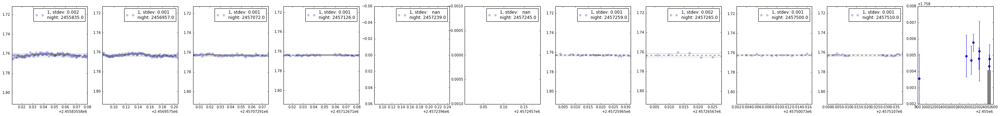

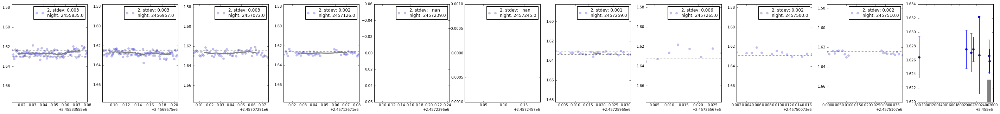

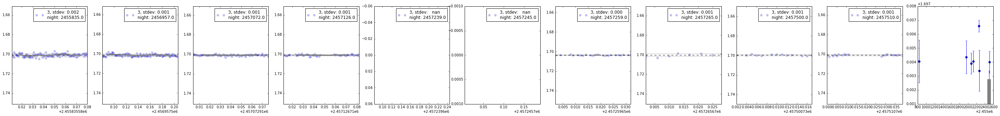

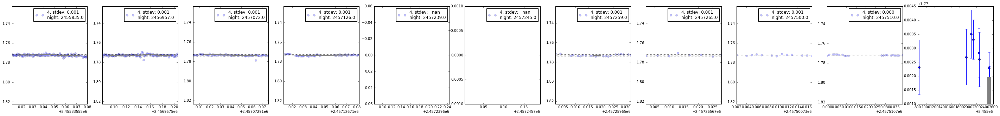

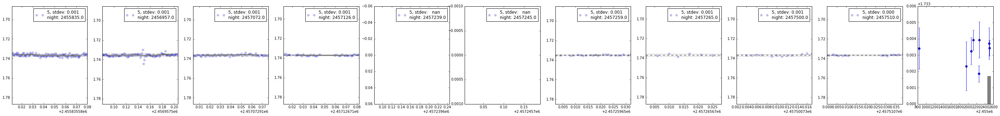

...

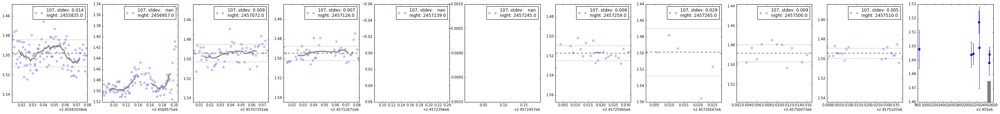

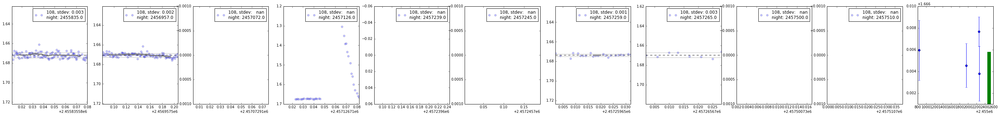

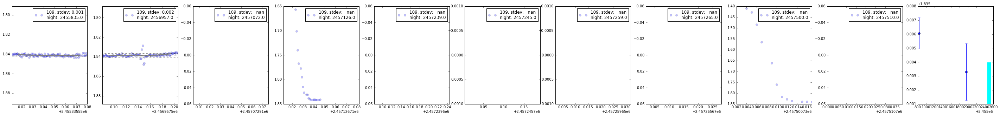

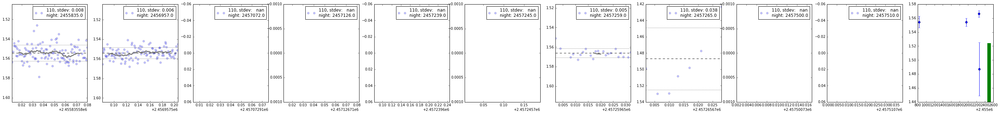

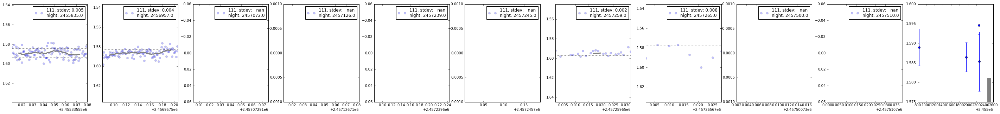

In [11]:
for source in sources:
    if source == 35:
        continue
    plt.figure(figsize=(5 * number_of_nights,5))

    night_means = []
    night_stds = []
    night_bins = []
    for i, this_night in enumerate(unique_nights):
        plt.subplot(1, number_of_nights + 1, i + 1)
        night_mask = (night == this_night)
        night_mean, night_std = plot_magnitudes(mags=mags[source-1][night_mask],
                                                times=aij_raw['BJD_TDB'][night_mask],
                                                source=source, night=this_night,
                                                ref_mag=brightest_mag)
        night_means.append(night_mean)
        night_stds.append(night_std)
        night_bins.append(this_night)
        
    plt.subplot(1, number_of_nights + 1, number_of_nights + 1)
  
    # Plot variation over nights.
    night_means = np.array(night_means)
    plt.errorbar(night_bins, night_means, yerr=night_stds, fmt='o')
    variation = night_means.max() - night_means.min()
    size = 10000*variation
    y_lims = plt.ylim()
    y_range = plt.ylim()[1] - plt.ylim()[0]
    plt.scatter([0.8*(plt.xlim()[1]-plt.xlim()[0]) + plt.xlim()[0]], 
                [0.8*(y_range) + plt.ylim()[0]], 
                c='green', marker='o', s=size)
    
    # Plot bar proportional to Lomb-Scargle power.
    bad_mags = np.isnan(mags[source-1]) | np.isinf(mags[source-1])
    #bad_errs = np.isnan(mag_err[source-1])
    bads = bad_mags #| bad_errs
    good_mags = ~bads
    model = LombScargleFast().fit(aij_raw['BJD_TDB'][good_mags], 
                                  mags[source-1][good_mags])
    periods, power = model.periodogram_auto(nyquist_factor=100, oversampling=20)
    max_pow = power.max()
    print(source, max_pow)
    if max_pow > 0.5:
        color = 'green'
    elif max_pow > 0.4:
        color = 'cyan'
    else:
        color = 'gray'
        
    bar_x = (night_bins[-2] + night_bins[-1])/2
    plt.plot([bar_x, bar_x], [plt.ylim()[0], max_pow * y_range + plt.ylim()[0]], 
             color=color, linewidth=10)
    plt.ylim(*y_lims)
    

In [11]:
err = Column(mag_err[12].data, name='mag_error')

foo = Table([aij_raw['BJD_TDB'], mags[12], err])

NameError: name 'mag_err' is not defined

In [15]:
foo.write('kelt_12.csv')